# PRIMER PUNTO

Los estudiantes harán uso de la librería OpenCV con la cual separarán los objetos de interés de la imagen con ayuda de transformaciones morfológicas y binarización de la imagen para posteriormente permitir al código hacer un conteo de las celulas (50%)

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
ruta = r'/content/drive/MyDrive/Taller2Monitor/Imagen célula.jpg'

In [4]:
imagen = cv2.imread(ruta)

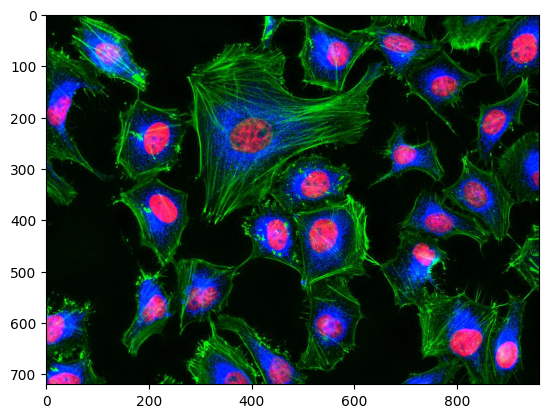

In [5]:
plt.imshow(imagen)
plt.show()
#plt.imshow(cv2.cvtColor(imagen,cv2.COLOR_BGR2BGRA))

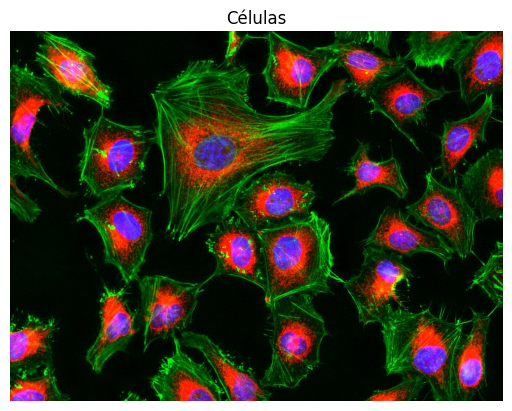

In [6]:
plt.imshow(cv2.cvtColor(imagen,cv2.COLOR_BGR2RGB))
plt.title('Células')
plt.axis('off')
plt.show()

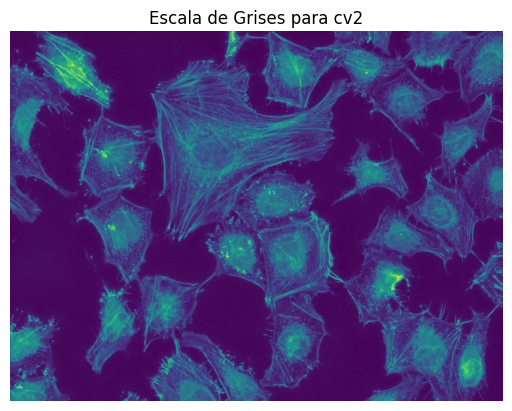

In [7]:
gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
plt.imshow(gris)
plt.title('Escala de Grises para cv2')
plt.axis('off')
plt.show()

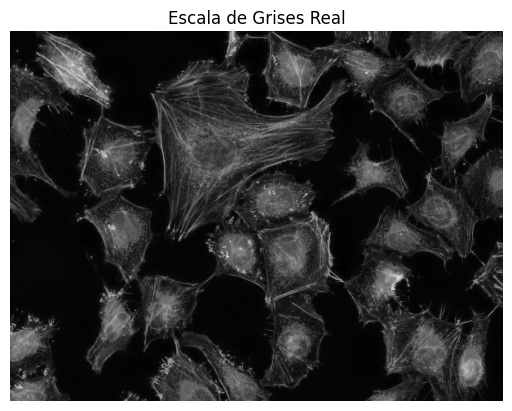

In [8]:
grises = cv2.cvtColor(gris, cv2.COLOR_GRAY2BGR)
plt.imshow(grises)
plt.title('Escala de Grises Real')
plt.axis('off')
plt.show()

In [9]:
media = np.mean(gris)
print(media)

36.23552372685185


In [10]:
noMedia = np.mean(imagen)
print(noMedia)

31.30494068287037


UMBRALES

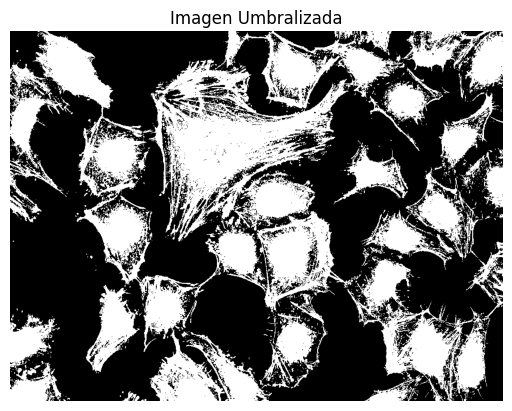

In [11]:
_,imgUmb = cv2.threshold(gris,media,255,cv2.THRESH_BINARY)
plt.imshow(cv2.cvtColor(imgUmb, cv2.COLOR_GRAY2BGR))
plt.title('Imagen Umbralizada')
plt.axis('off')
plt.show()

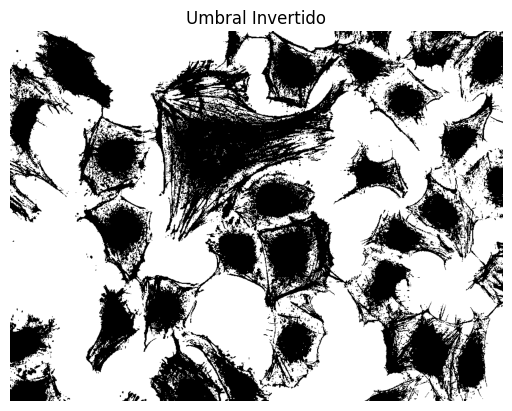

In [12]:
_,imgUmb1 = cv2.threshold(gris,media,255,cv2.THRESH_BINARY_INV)
plt.imshow(cv2.cvtColor(imgUmb1, cv2.COLOR_GRAY2BGR))
plt.title('Umbral Invertido')
plt.axis('off')
plt.show()

DILATACIÓN

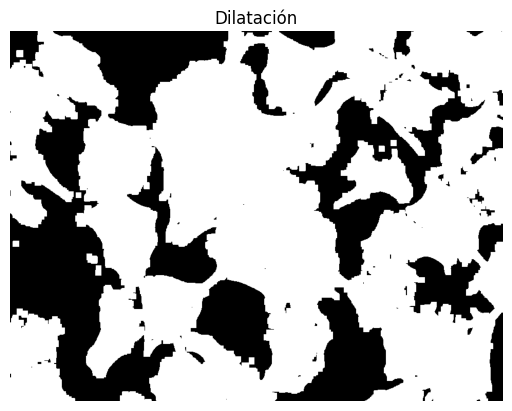

In [13]:
dilatacion = cv2.dilate(imgUmb,np.ones([2,2],np.uint8),iterations=10)
plt.imshow(cv2.cvtColor(dilatacion, cv2.COLOR_GRAY2BGR))
plt.title('Dilatación')
plt.axis('off')
plt.show()

In [14]:
imagen.shape

(720, 960, 3)

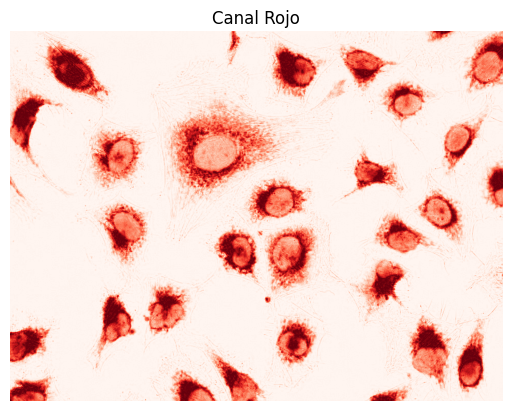

In [15]:
real = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.imshow(real[:,:,0], cmap='Reds')
plt.title('Canal Rojo')
plt.axis('off')
plt.show()

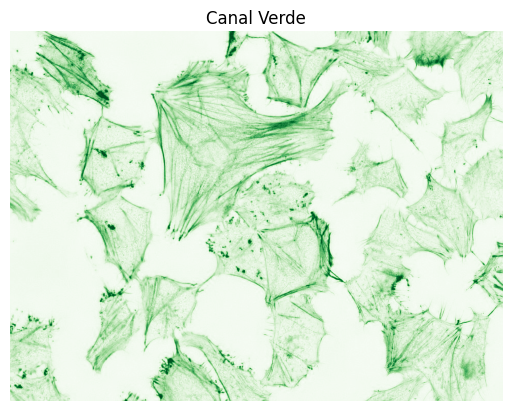

In [16]:
plt.imshow(real[:,:,1], cmap='Greens')
plt.title('Canal Verde')
plt.axis('off')
plt.show()

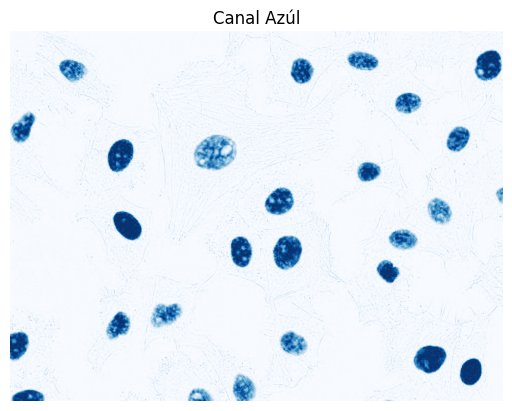

In [17]:
imgAzul = plt.imshow(real[:,:,2], cmap='Blues')
plt.title('Canal Azúl')
plt.axis('off')
plt.show()

OFICIALES

In [18]:
azul = real[:,:,2]

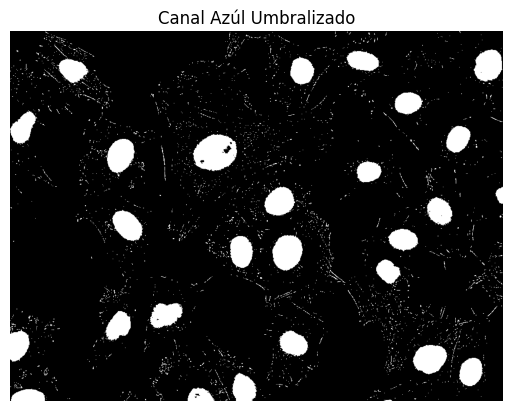

In [19]:
_,imgUmb2 = cv2.threshold(azul,media,255,cv2.THRESH_BINARY)
plt.imshow(cv2.cvtColor(imgUmb2, cv2.COLOR_GRAY2BGR))
plt.title('Canal Azúl Umbralizado')
plt.axis('off')
plt.show()

EROSIÓN

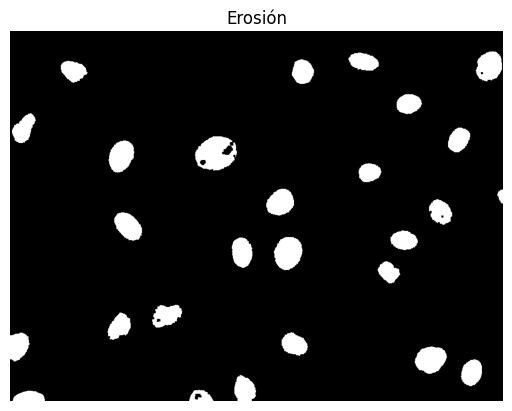

In [20]:
erosion = cv2.erode(imgUmb2,np.ones([2,2],np.uint8),iterations=3)
plt.imshow(cv2.cvtColor(erosion, cv2.COLOR_GRAY2BGR))
plt.title('Erosión')
plt.axis('off')
plt.show()

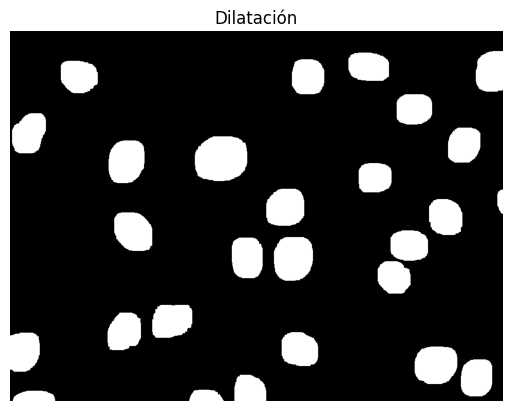

In [65]:
dilatacion1 = cv2.dilate(erosion,np.ones([2,2],np.uint8),iterations=20)
plt.imshow(cv2.cvtColor(dilatacion1, cv2.COLOR_GRAY2BGR))
plt.title('Dilatación')
plt.axis('off')
plt.show()

CONTAR

In [22]:
contar,_ = cv2.findContours(dilatacion1,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
len(contar)

27

BORDES

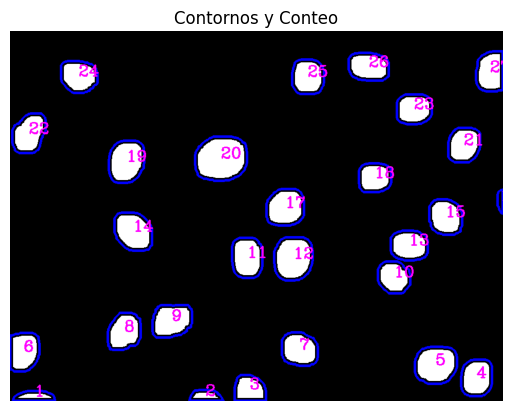


Nùmero de células encontradas: 27


In [123]:
dilatacion1_rgb = cv2.cvtColor(dilatacion1,cv2.COLOR_GRAY2RGB)

dibujo = cv2.drawContours(dilatacion1_rgb,contar,-1,(0,0,255),3)
for i,contorno in enumerate(contar):
  M = cv2.moments(contorno)
  if M['m00'] != 0:
    cX = int(M['m10']/M['m00'])
    cY = int(M['m01']/M['m00'])
  else:
    cX,cY = 0,0

  cv2.putText(dibujo, str(i+1),(cX,cY), cv2.FONT_HERSHEY_COMPLEX,1,(255,0,255),2)

plt.imshow(dibujo)
plt.title('Contornos y Conteo')
plt.axis('off')
plt.show()

numC = len(contar)
print(f'\nNùmero de células encontradas:', numC)

# Segundo pundo

a)      De una única carpeta los estudiantes recolectarán todas las imágenes en formato .dcm y las guardarán en una lista en el orden de las imágenes (Están organizadas de 1 a 20) (25%)

In [124]:
!pip install pydicom

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.8 MB/s eta 0:00:00


In [126]:
import pydicom
from pydicom import dcmread
import os

In [132]:
auxList = []
path = '/content/drive/MyDrive/Taller2Monitor/archivosDCM/'
for i in range(1,10):
    auxList.append(path + 'image-00000'+str(i)+'.dcm')
for i in range(10,21):
    auxList.append(path + 'image-0000'+str(i)+'.dcm')

In [133]:
auxList

['/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000001.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000002.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000003.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000004.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000005.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000006.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000007.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000008.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000009.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000010.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000011.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000012.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000013.dcm',
 '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000014.dcm',
 '/con

In [134]:
len(auxList)

20

b) Deben implementar la visualización de las imágenes en bucle, de manera que al correr el código se vean las imágenes una por una, la forma en que esto se haga queda a decisión del estudiante, pero debe cumplir que una vez se vea una imagen se verá la otra (No tiene porque ser automático o dinámico, solo debe ser capaz de ver secuencialmente las imágenes) (25%)

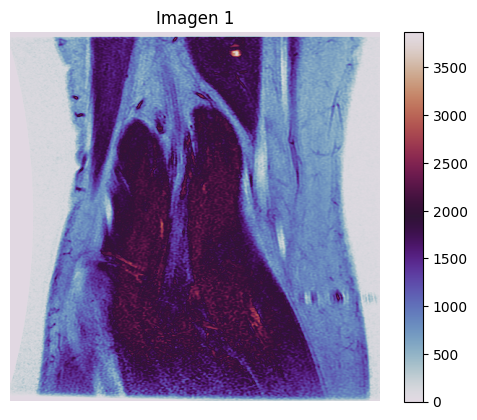

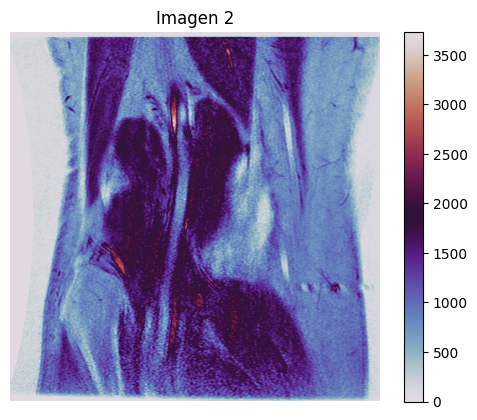

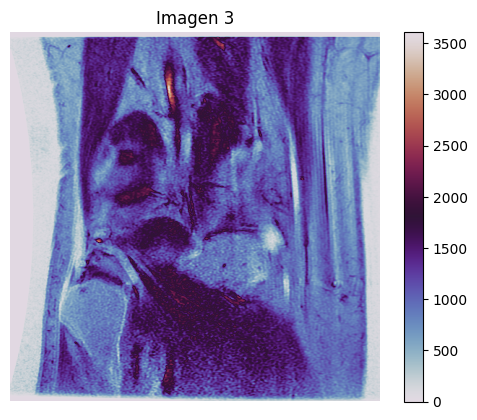

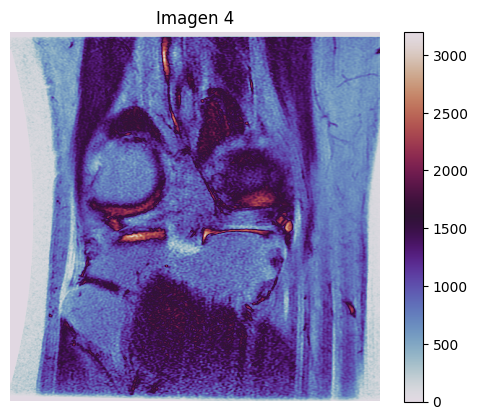

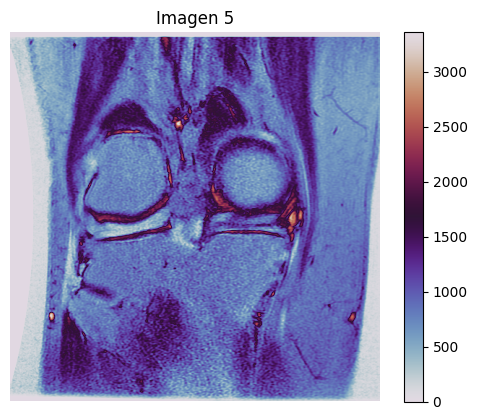

...

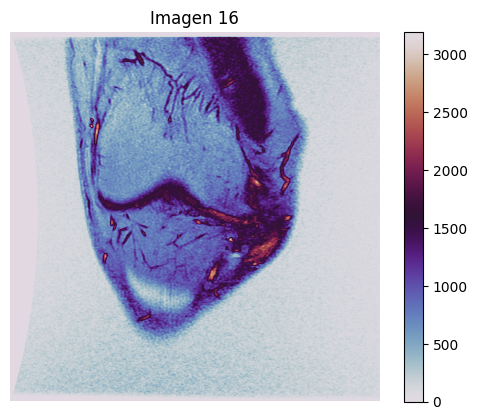

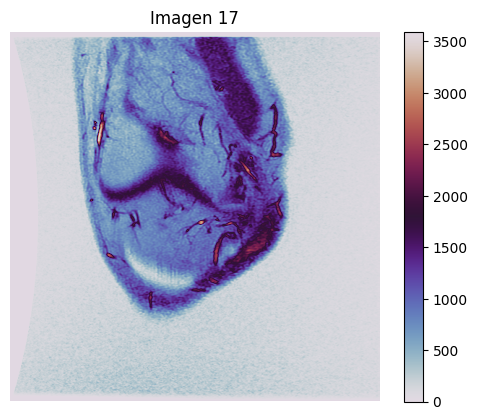

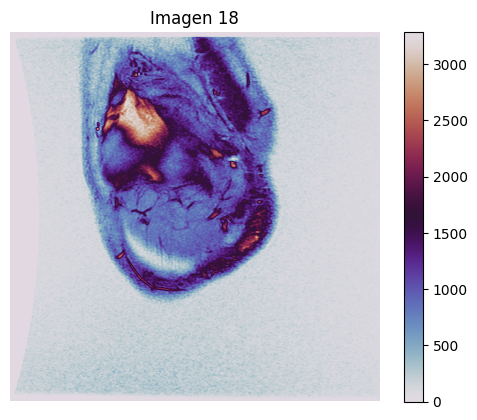

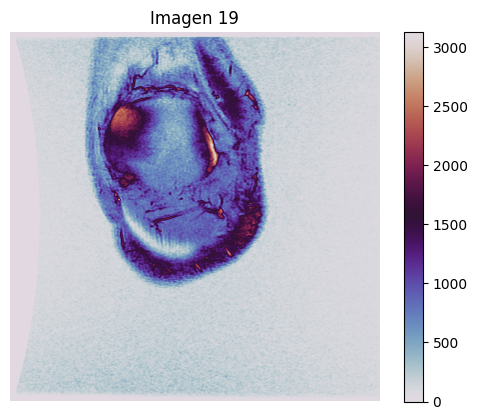

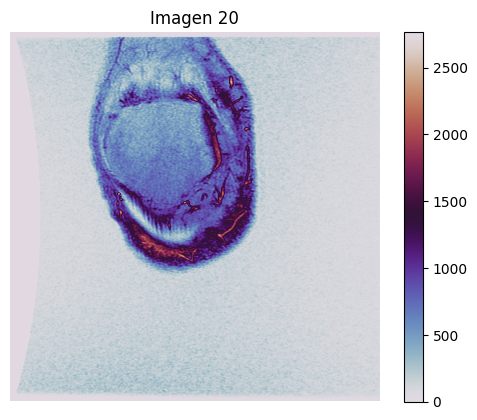

In [135]:
for i,a in enumerate(auxList):
  leer = pydicom.dcmread(a)
  im = leer.pixel_array
  plt.imshow(im, cmap= 'twilight')
  plt.axis('off')
  plt.title(f'Imagen {i+1}')
  plt.colorbar()
  plt.show()

Se encontró otra manera de resolver el punto b haciendo uso de la libreria "re" que visualizamos en la página oficial de python

https://es.stackoverflow.com/questions/140046/cómo-ordenar-una-lista-de-archivos-en-forma-numérica

In [137]:
directorio = r"/content/drive/MyDrive/Taller2Monitor/archivosDCM"
listaImgdcm = []

for archivo in os.listdir(directorio):
  if archivo.endswith(".dcm"):

    rutaArch = os.path.join(directorio, archivo)
  listaImgdcm.append(rutaArch)


In [138]:
print(listaImgdcm)

['/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000004.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000001.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000005.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000003.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000002.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000006.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000018.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000008.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000007.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000020.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000019.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000016.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000017.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000015.dcm', '/content/drive/MyD

In [139]:
import  re

r = re.compile(r"(\d+)")
listaImgdcm.sort(key=lambda x: int(r.search(x).group(1)))
print(listaImgdcm)

['/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000004.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000001.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000005.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000003.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000002.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000006.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000018.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000008.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000007.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000020.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000019.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000016.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000017.dcm', '/content/drive/MyDrive/Taller2Monitor/archivosDCM/image-000015.dcm', '/content/drive/MyD

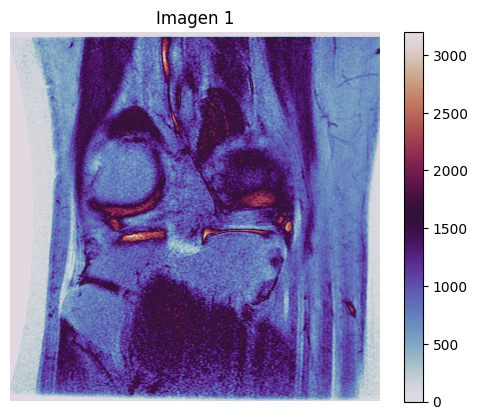

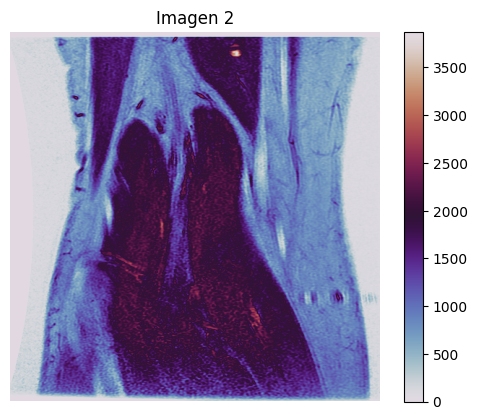

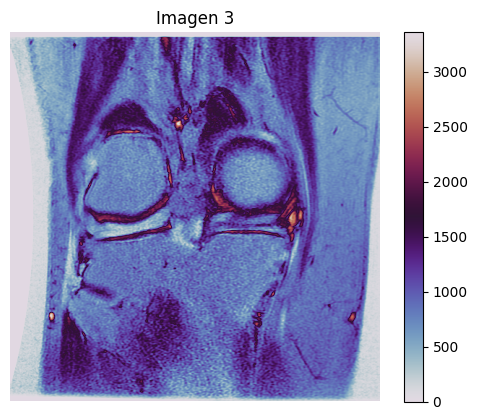

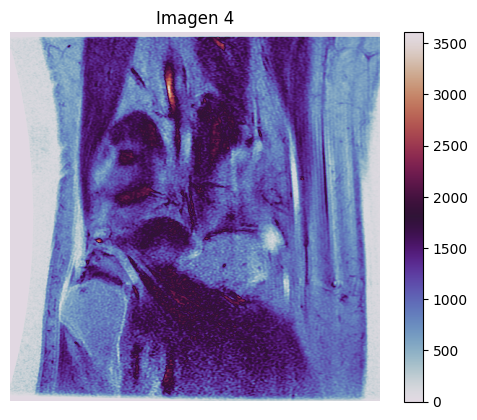

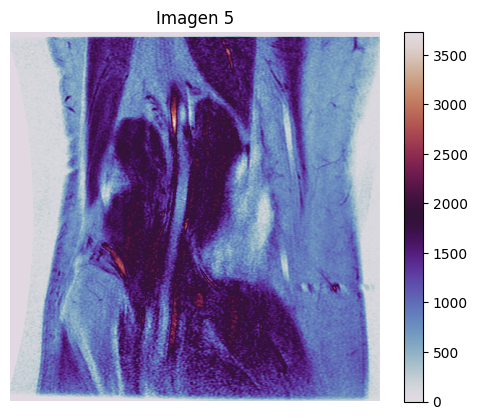

...

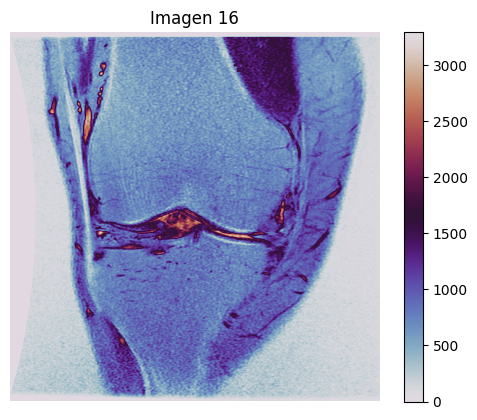

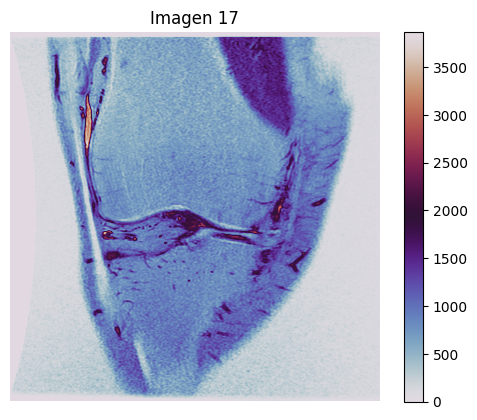

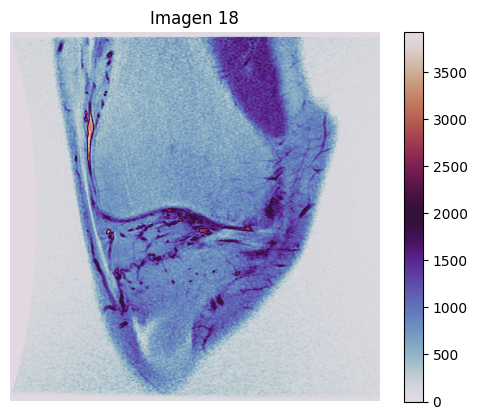

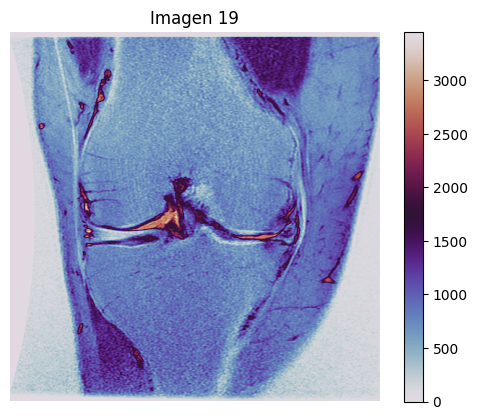

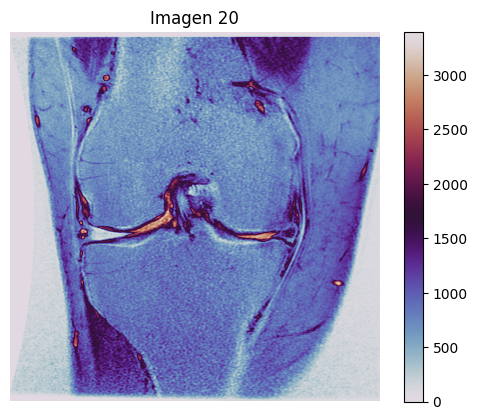

In [140]:
for i,a in enumerate(listaImgdcm):
  leer = pydicom.dcmread(a)
  im = leer.pixel_array
  plt.imshow(im, cmap= 'twilight')
  plt.axis('off')
  plt.title(f'Imagen {i+1}')
  plt.colorbar()
  plt.show()

#Bibliografías utilizadas

https://la.mathworks.com/help/matlab/ref/matlab.io.datastore.imagedatastore.html

https://docs.python.org/es/3.9/library/io.html

https://la.mathworks.com/help/images/create-image-datastore-containing-dicom-images.html

https://www.youtube.com/watch?v=Gm7XrxbtTPA

https://omes-va.com/contornos/#google_vignette

https://medium.com/@rubenmndez/lee-imagen-con-cv2-en-google-colab-345c56d161fe
